### Intro

This notebook provides a small tutorial on how to use the HR-SpARTA code to reduce and analyse High-Resolution spectroscopy data from the SPIRou instrument. 
- Git: https://github.com/admasson/HR-SpARTA
- contact: amasson@cab.inta-csic.es

It is advised to first setup a python virtual environment **in any Python 3.9 version (!!)** : 
- $ python -m venv .venv
- $ source .venv/bin/activate

Verify that the environment has been properly activated with:
- $ which python
- $ which pip

And then install the required modules:
- $ pip install -r requirements.txt

### Loading a data set

We first start by calling a few jupyter magic commands. 

These are optionnal and can be commented in case of problem. 

If the %matplotlib widget doesn't work, make sure to install ipympl & ipywidgets with pip, and then **close the notebook completely (kill its terminal) and restart it!**

In [1]:
# Jupyter magic to automatically reload modules after modification
%load_ext autoreload 
%autoreload 2

# Jupyter magic to unlock interactive matplotlib widgets
%matplotlib widget 


The next step is to go to the [HR_SpARTA/transits_parameters.py](HR_SpARTA/transits_parameters.py) file and define our system parameters. 

This is where we define the path to the data file and every other informations the code will require. An example is provided to show the structure required by the dictionnary.

In [2]:
from HR_SpARTA.transits_parameters import WASP76_2020 # import our transit dictionnary
from pprint import pprint # to pretty print the dictionnary

pprint(WASP76_2020)


09:46:33.087673 : transits_info.py has been loaded
{'Kp': 198213.87849430053,
 'Ks': 116.02,
 'M/H': 0.366,
 'Mp': 1.6969233900184293e+27,
 'Ms': 2.8991015914777584e+30,
 'Porb': 1.8098806,
 'Rp': 132546168.0,
 'Rs': 1221649200.0,
 'SNR_hdu_index': 0,
 'SNR_key': 'SPEMSNR',
 'Sys_Age': 1.816,
 'Teff': 6329,
 'Teq': 2160,
 'U_midpoint': 0.00012,
 'Vs': -790.0,
 'a': 4936729733.1,
 'c': [0.19, 0.305],
 'data_dir': './data/WASP-76/2020-10-31/',
 'e': 0,
 'i': 89.623,
 'lbda': 61.28,
 'log(g)': 4.196,
 'midpoint': 2459153.8848966,
 'planet_logg': 2.8093336065831234,
 'vsini': 1480.0,
 'w': 0}


The next step is to load the data and build the DataSet class, which will allows us to perform all of the reduction steps in a straightforward way.

This is done with the load_transit() function from HR_SpARTA.reduction:

In [3]:
# Load the transit
from HR_SpARTA.reduction import load_transit
data_set = load_transit(WASP76_2020)


/home/amasson/Bureau/tuto estelle/HR-SpARTA/.venv/lib/python3.9/site-packages/radvel/gp.py:32: ImportWarning: celerite not installed. GP kernals using celerite will not work. Try installing celerite using 'pip install celerite'
  warnings.warn("celerite not installed. GP kernals using celerite will not work. \


2.654008852068807e-06
09:46:35.135236 : plots.py has been loaded
09:46:35.135262 : reduction.py has been loaded
Loading files with format 't.fits' in './data/WASP-76/2020-10-31/' :
27 out of 54 files selected !

The following hdu will be extracted with the following roles. Please make sure this is what you want :
Selected HDU 'FluxAB' at index 1 as 'data'.
Selected HDU 'WaveAB' at index 2 as 'wavelengths'.
Selected HDU 'BlazeAB' at index 3 as 'blaze'.
Selected HDU 'Recon' at index 4 as 'tellurics'.
Selected HDU 'OHLine' at index 5 as 'OHLine'.

Building data cube of shape : (27, 49, 4088)
Filling the data cube with selected files...

Building the off-transit spectra masked :

27 / 27
Found 10 off-transit spectra among 27 spectra

Find off transit spectra done !

This step has been saved with ID : 'find_off_transit'
------------------------------
Compute Kepler orbit done
Compute transit window weight orbit done

27 files with 't.fits' have been succesfully loaded from './data/WASP-76/2

Note that by default the "load_transit" function will do the following:
- load the "*t.fits" files located in the "data_dir" path provided in the transit dictionary
- extract the data from the FITS files and store them in a 3D data cube
- perform some orbital and transit geometry calculation to determine the in- and out- transit observations, along with the planet's radial velocity in earth and stellar rest-frame.

It is therefore useful to have a look at the info printed by the function, and notably check that:

<img src="notebook_ressources/img1.png" width="900"/>

If the files are properly loaded but all observations are found to be off-transit, then it probably means you made a mistake when defining the transit's midpoint in the parameters dictionnary.

The DataSet class is the main object we manipulate to perform the reduction. In our case, we created a DataSet object under the "data_set" variable name:

In [4]:
type(data_set)


HR_SpARTA.reduction.DataSet

 We can directly access (**and modify !!**) the data we loaded using the ".data" attribute which returns a 3D numpy array. The first dimension corresponds to the time axis, the second to the spectral orders, and the third to the wavelength axis of a given order:

In [5]:
print(type(data_set.data))
print(data_set.data.shape)


<class 'numpy.ndarray'>
(27, 49, 4088)


The DataSet also contains arrays corresponding to the wavelength of each data point (in nm and in vacuum for SPIRou), telluric absorption and OH models from APERO, and blaze function. 

Each of these arrays have the exact same size as the data cube, such that we can easily perform operations between them and ensure one element in an array corresponds to the elements at the same position in the other arrays:

In [6]:
print(data_set.wave.shape)
print(data_set.tellurics.shape)
print(data_set.blaze.shape)
print(data_set.OH_lines.shape)


(27, 49, 4088)
(27, 49, 4088)
(27, 49, 4088)
(27, 49, 4088)


We can then manually plot our data using our favorite matplotlib functions:

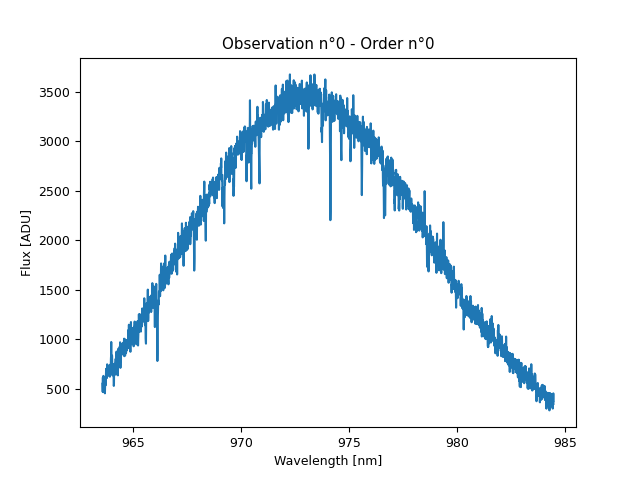

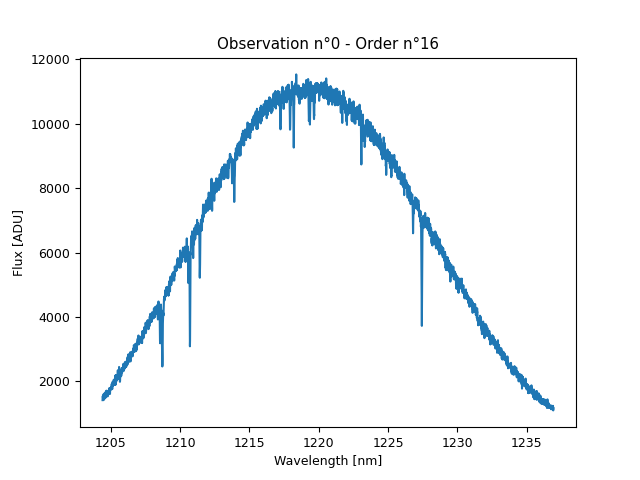

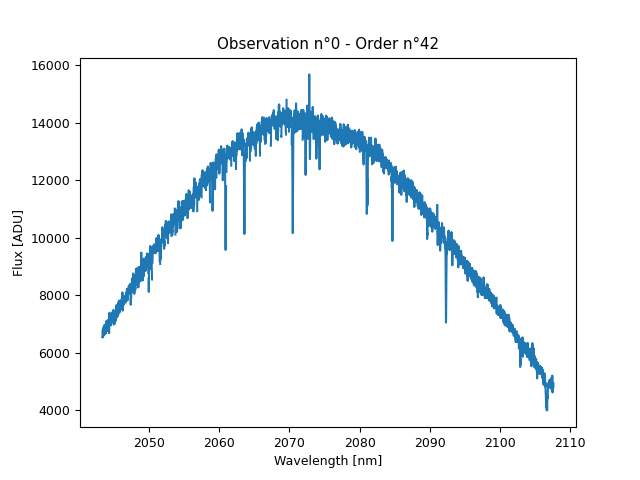

In [7]:
import matplotlib.pyplot as plt

# manual plot
obs = 0
for order in [0,16,42]:
    plt.figure()
    plt.plot(data_set.wave[obs,order],data_set.data[obs,order])
    plt.xlabel('Wavelength [nm]')
    plt.ylabel('Flux [ADU]')
    plt.title(f'Observation n°{obs} - Order n°{order}')


Same with the blaze, tellurics, and OH lines:

Text(0.5, 1.0, 'OH lines (Observation n°0 - Order n°8)')

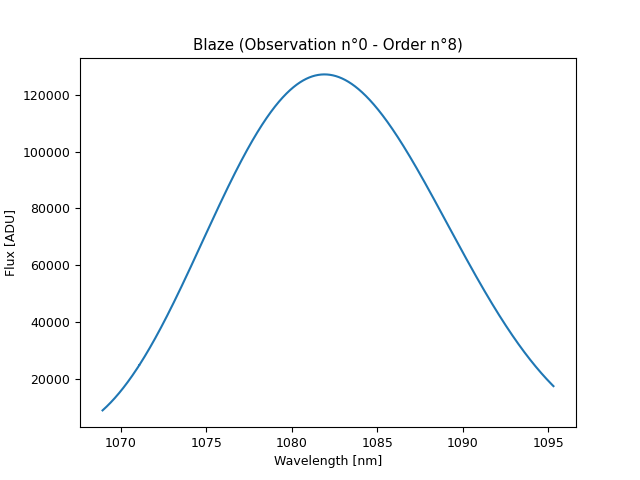

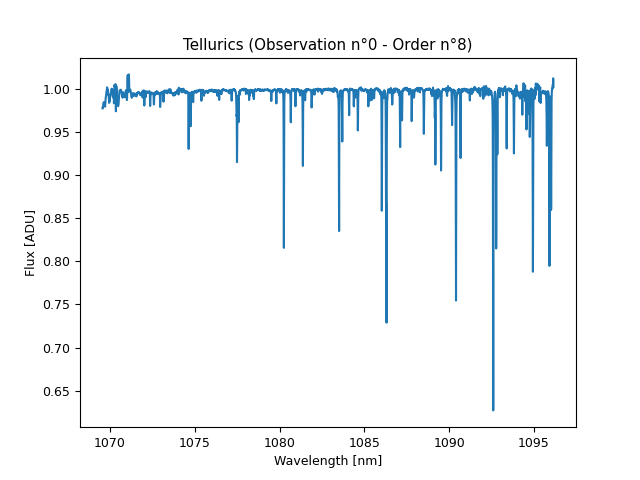

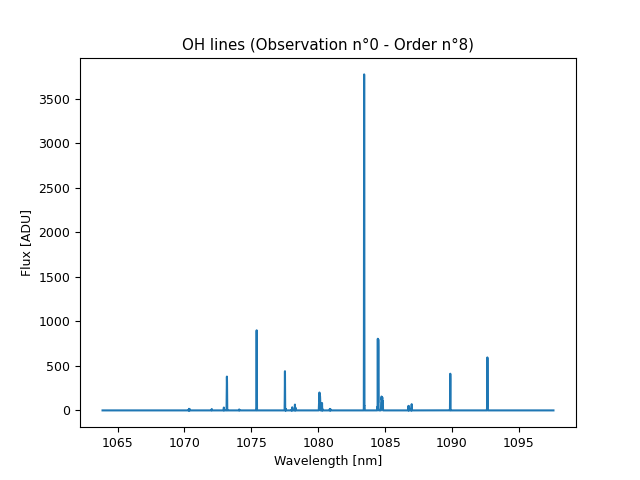

In [8]:
obs,order = 0, 8

plt.figure()
plt.plot(data_set.wave[obs,order],data_set.blaze[obs,order])
plt.xlabel('Wavelength [nm]')
plt.ylabel('Flux [ADU]')
plt.title(f'Blaze (Observation n°{obs} - Order n°{order})')

plt.figure()
plt.plot(data_set.wave[obs,order],data_set.tellurics[obs,order])
plt.xlabel('Wavelength [nm]')
plt.ylabel('Flux [ADU]')
plt.title(f'Tellurics (Observation n°{obs} - Order n°{order})')

plt.figure()
plt.plot(data_set.wave[obs,order],data_set.OH_lines[obs,order])
plt.xlabel('Wavelength [nm]')
plt.ylabel('Flux [ADU]')
plt.title(f'OH lines (Observation n°{obs} - Order n°{order})')


The DataSet class also provides a set of built-in methods for easy plotting:

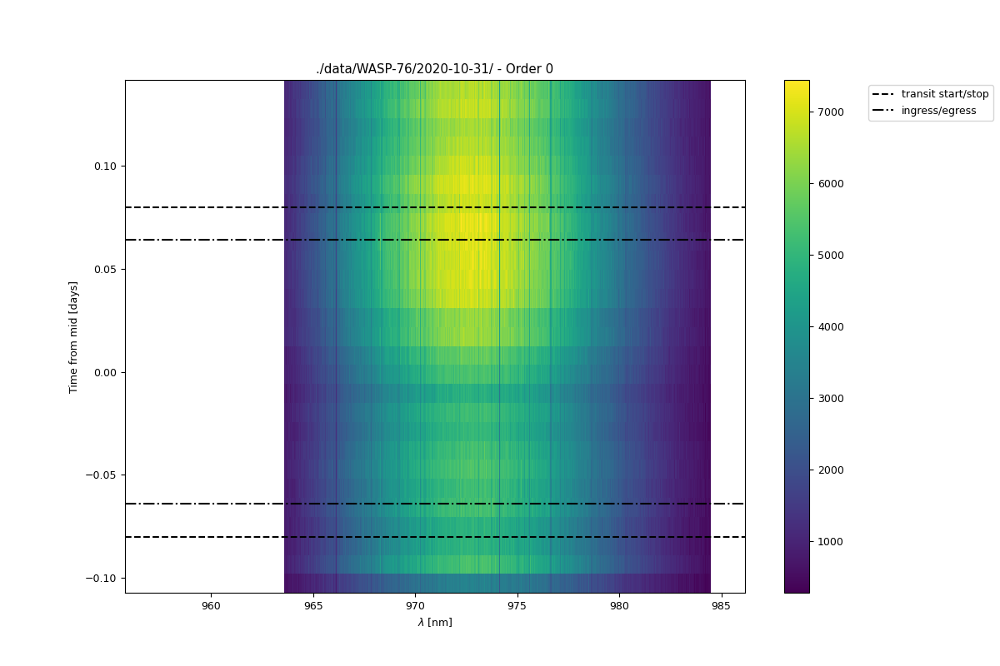

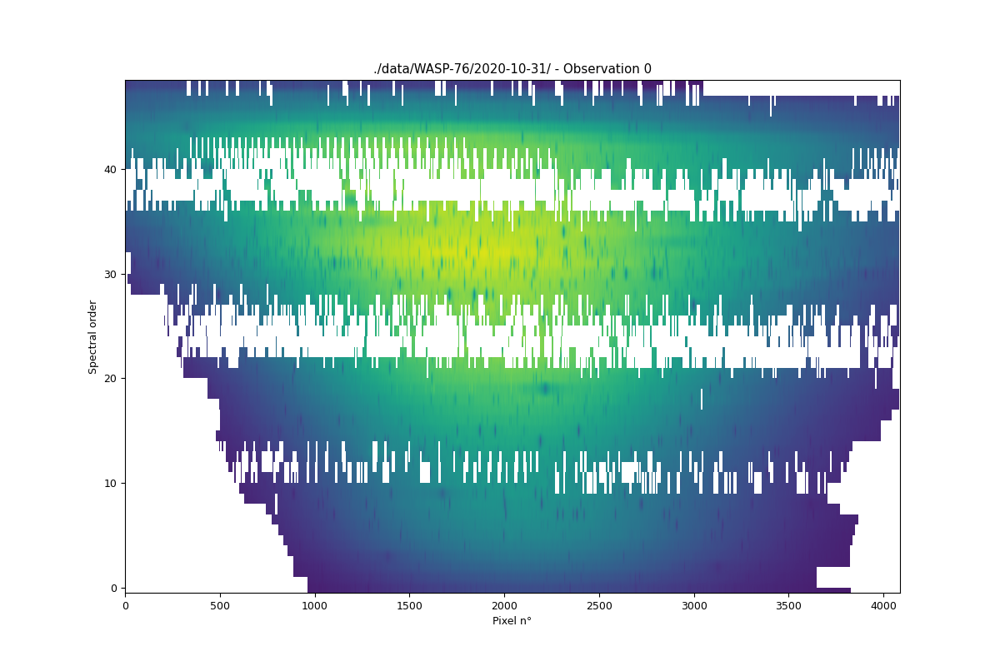

In [9]:
# plot a 2D image of a given order. Set contact_point to True to show start/stop of the transit
data_set.plot_2d_order(order=0, contact_point = True)

# plot a 2D image of a given observation
data_set.plot_2d_obs(obs=0)


The HR_SpARTA.plots module also offer some additional plotting tools:

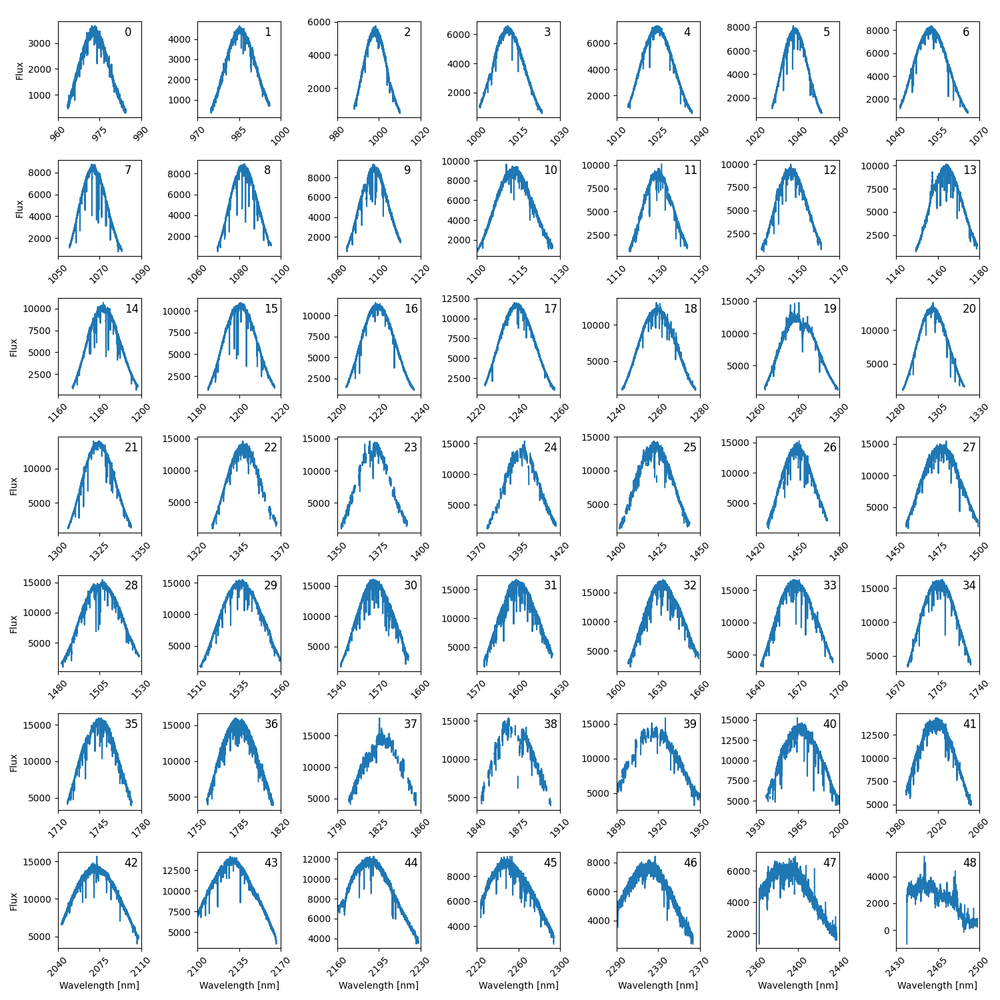

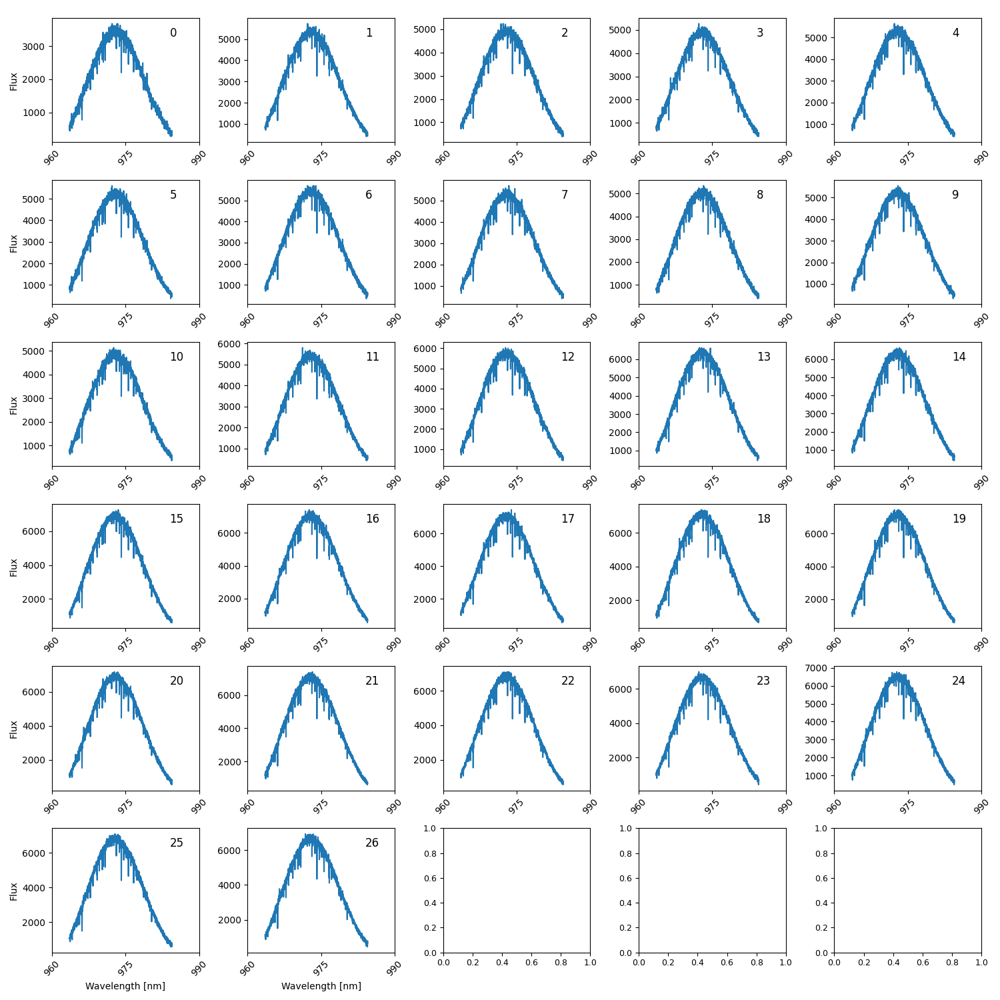

In [10]:
from HR_SpARTA.plots import plot_grid

# plot a grid of all orders in 1D spectra
obs = 0
plot_grid(data_set.wave[obs],data_set.data[obs],Ylabel='Flux',Xlabel='Wavelength [nm]')

# plot a grid of all observations in 1D spectra
order = 0
plot_grid(data_set.wave[:,order],data_set.data[:,order],Ylabel='Flux',Xlabel='Wavelength [nm]')


### Data reduction

Now that our data is loaded and ready, we can easily apply the different reduction steps by calling the corresponding DataSet methods. We'll do it here step-by-step:

**Divide by blaze function**

Simply divide by the stored blaze function, no parameters required

In [11]:
data_set.div_by_blaze()



Division by blaze function done !

This step has been saved with ID : 'div_by_blaze'
------------------------------


**Apply telluric transmission clipping**

Remove spectral bins corresponding to wavelength where telluric absorption is too high. Optional parameters are:
- min_threshold (float) -> 0 to 1, the threshold under which a telluric line is flagged as being clipped
- remove_entire_spec_line (bool) -> whether to remove the entire telluric line (True) or only pixels below threshold (False)
- max_threshold (float) -> 0 to 1, in case we remove the entire line we'll stop at this transmission value
- plot (bool) -> plot the clipping

In [13]:
data_set.telluric_transmission_clipping?


Signature:
data_set.telluric_transmission_clipping(
    min_threshold=0.4,
    remove_entire_spec_line=False,
    max_threshold=0.97,
    save=None,
    print_info=True,
    plot=False,
)
Docstring: <no docstring>
File:      ~/Bureau/tuto estelle/HR-SpARTA/HR_SpARTA/reduction.py
Type:      method


Clipping all data points corresponding to wavelengths of spectral lines below 0.97 transmittance and whose center falls below 0.4.

4025/4025
Telluric clipping with telluric spectral line removing between 0.4 & 0.97 transmittance done !

This step has been saved with ID : 'telluric_transmission_clipping'
------------------------------


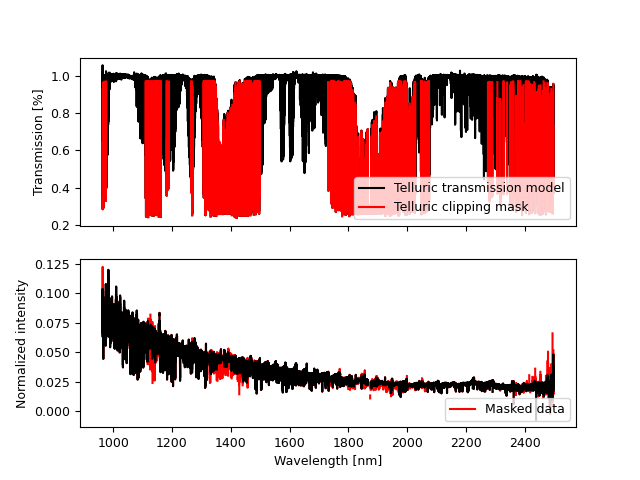

In [14]:
data_set.telluric_transmission_clipping(remove_entire_spec_line = True, plot = True)


**Normalisation with median**

Normalize each order and observation by its median value. No argument required.

In [15]:
data_set.norm_with_median()



Normalization with median along observations done !

This step has been saved with ID : 'norm_with_median'
------------------------------


**Sigma clipping along time axis**

Remove any value farther than n $\sigma$ from a polynomial trend of the intensity along time. Arguments are:
- model_deg (int): the degree of the polynomial feet, 2 is enough in general
- iterations (int): how many iterations for the clipping, new models will be drawn at each iteration on the remaining values
- n_sigma (int): the number of sigma above which values are clipped
- plot_sigma (bool): plot an interactive 2D image of the data, showing values that have been clipped

In [16]:
data_set.sigma_clipping_on_obs?


Signature:
data_set.sigma_clipping_on_obs(
    model_deg,
    iterations,
    n_sigma,
    plot_sigma=False,
    save=None,
    print_info=True,
)
Docstring:
For each wavelength (of all orders), take the evolution of the intensity at this wavelength along the observations,
draw a polynomial model of this evolution, and remove any pixel whose intensity is distant from the model more than n_sigma.
File:      ~/Bureau/tuto estelle/HR-SpARTA/HR_SpARTA/reduction.py
Type:      method


Applying sigma clipping on obs, looping over iterations :

5/5171149
True


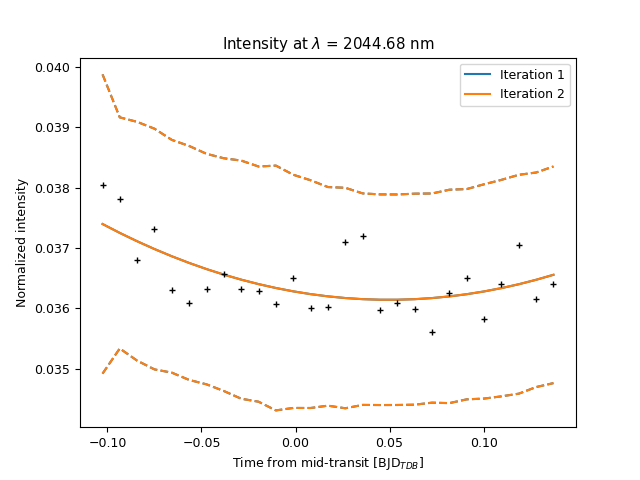


Sigma clipping along observation done !

This step has been saved with ID : 'sigma_clipping_obs'
------------------------------


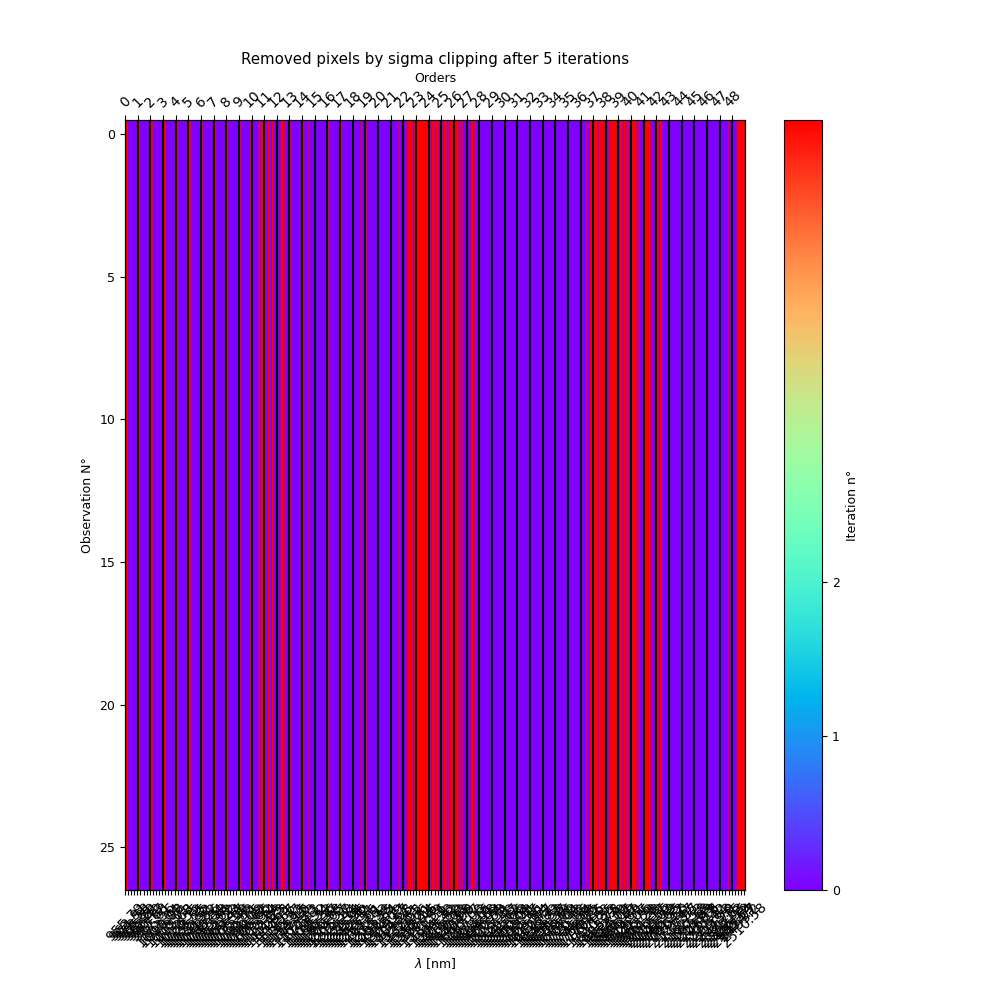

In [17]:
data_set.sigma_clipping_on_obs(model_deg=2, iterations=5, n_sigma=4, plot_sigma=True)


**Flattening with a moving average**

Remove instrumental low-frequency noise with a moving average. Arguments:
- area (int): the width (in pixels) of the door function used for the convolution. **Must be odd!**

In [18]:
data_set.div_by_moving_average(area=119)  



Computing moving average by convoluing each spectra with a normalized door function of size 119 pixels :

1323/1323
Division by moving average with area size 119 done !

This step has been saved with ID : 'div_by_moving_average'
------------------------------


**Detrending with airmass**

Detrend with airmass by bringing all observations back to a reference airmass with polynomial fitting. Arguments are:
- model_deg (int) : the degree of the polynomial model
- iterations (int) : the number of iterations to fit the model with progressive outliers rejections
- n_sigma (int) : the threshold in number of $\sigma$ to exclude outliers from the fitting
- plot_sigma (bool) : whether to plot the outlier rejection
- use_log (bool) : whether to perform the detrending in log-space of the flux or not

From a theoretical approach, it's better to apply this correction in log-space, although the effect is negligible from my experience. 

A 2 degree model is generally enough.

This step is redundant with PCA or SysREM: we're doing it here as an example, but we can skip this step in practice when including PCA / SysREM in our reduction.

We can check that everything went fine by ensuring that "I_avg / I_th_avg" is close to 1. This is from mathematical considerations on how the detrending is performed, but we won't dig into this here ;)

working on log-space

Applying airmass correction, looping over iterations :

5/5Here are some index corresponding to iteration 2:
(array([ 2, 14, 16, 17, 18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 20, 21,
       21]), array([124405, 179865, 186536, 194108, 184664, 184665, 184667,   9470,
       138031, 138032, 138033, 138034, 152969, 152970, 170701, 131194,
       132088, 143279]))
[1565.00157858 2166.15276613 2269.83661074 2400.9334382  2237.00341713
 2237.02191534 2237.05890868  991.40083095 1684.02558374 1684.03744659
 1684.04930867 1684.06117    1825.34206279 1825.35622163 2038.33433769
 1613.43610094 1625.34761714 1720.92805462]


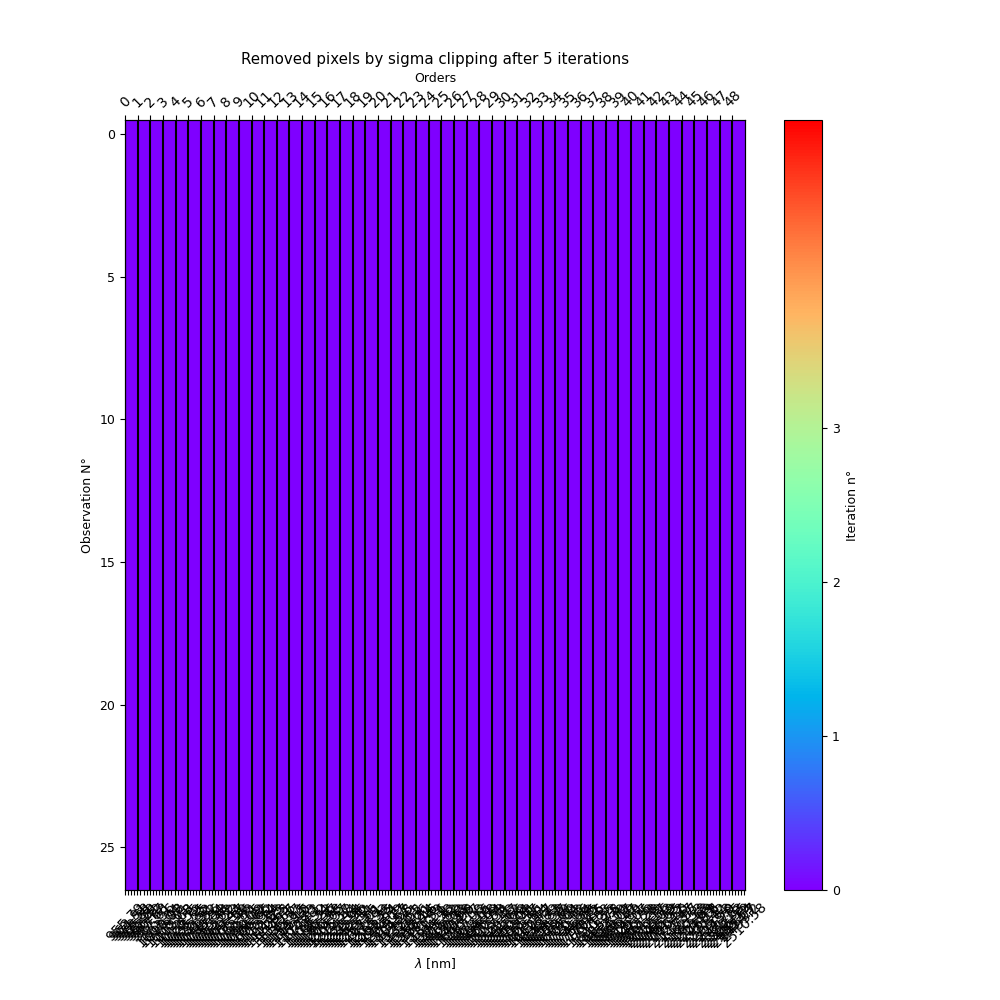


I_avg / I_th_avg = 1.0000000001692047

Airmass correction done !

This step has been saved with ID : 'airmass_correction'
------------------------------


In [19]:
data_set.airmass_correction(model_deg=2, iterations=5, n_sigma=4, plot_sigma=True, use_log=True)


**Division by a master spectrum**

This is probably the most important part: we estimate the mean signal of the star (and Earth residuals) and remove it from our data.

We used to have a more complex function that performed Rossiter-McLaughlin & Center to Limb Variations corrections, but it's under upgrade to be used with Turbospectrum and therefore not available yet.

We thus use a simple average of observations, which we can decide to compute either considering the *full* transit or *out-of-transit* observations only. Arguments are:
- transit_mask (str) : set "full" to average all transit observations (default), or 'off' to average on off-transit observations only

In [20]:
data_set.div_by_weighted_average(transit_mask='full')



Division by SNR**2 weighted average spectra along observations done !

This step has been saved with ID : 'div_by_weighted_average'
------------------------------


**Remove residuals with PCA or SysREM**

We remove uncorrected residuals with PCA or SysREM. This can be done with 2 different functions:

*data_set.PCA()* : use PCA to remove the first principal components (PCs) and correct residuals. Arguments are:
- Kneedle (bool) : use the Kneedle algorithm to automatically determine the number of PCs to remove (default)
- K (int) : manually set a constant number of first PCs to remove
- use_log (bool) : whether to perform the PCA in log-space of flux 
- show_var (bool) : whether to display the "scree plots", i.e. the variance per PCs

*data_set.SysREM_Kneedle()* : use SysREM, an iterative alternative to PCA, to perform the correction. It has been identified as slightly better than PCA, and automatically use the Kneedle algorithm to choose the number of PCs to remove. It takes longer to run than PCA though. Arguments are:
- use_log (bool) : whether to perform the PCA in log-space of flux 
- show_var (bool) : whether to display the "scree plots", i.e. the variance per PCs
- Nb_threads (int) : the number of threads to use for parallel computing. Let "0" for no parallelization, and avoid numbers higher than the number of physical CPU you have
- sigma_weights (bool) : whether to weight the algorithm with data uncertainty. True by default, as this is what makes SysREM slightly better than PCA


First round: running 27 iterations of SysREM per order to measure variance and find optimum nb of iterations with Kneedle

49/49	Nb fails: 0
Running Kneedle to find optimum nb of SysREM iterations per order: an arbitrary maximum of 5 removed components has been set to prevent Kneedle from removing to much components.
49/49	Nb fails: 0
SysREM FUNCTION done !

This step has been saved with ID : 'SysREM_Kneedle'
------------------------------


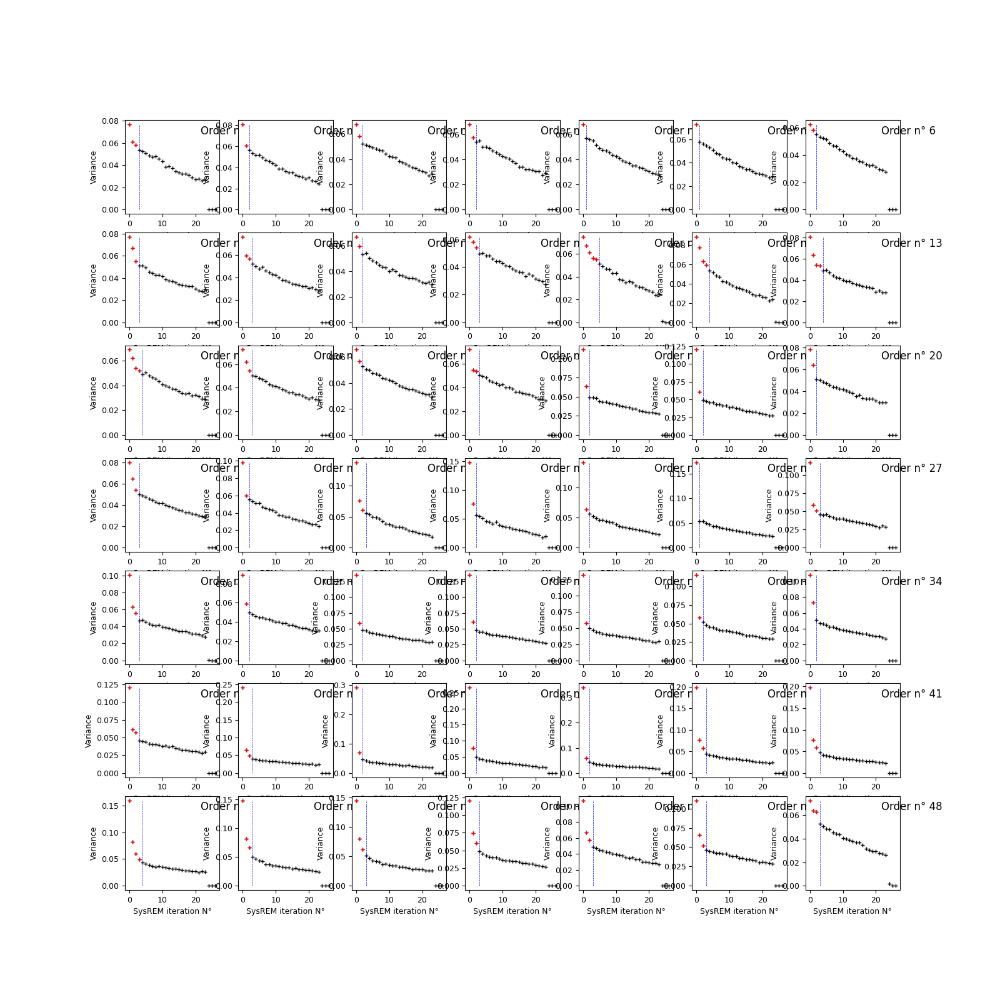

In [21]:
data_set.SysREM_Kneedle(use_log=True,show_var=True,Nb_threads=6)


**Sigma clipping along spectral axis**

Estimate the standard deviation tendency along the spectral axis with the *lowess* function, and remove outliers farther than n $\sigma$ from the model. Arguments are:
- n_sigma (int) : number of sigma used for the threshold
- frac (float) : 0 to 1, fraction of values on which the lowess is computed. Classic value is 0.2 (use a local 20% of the data to build the rolling model).
- max_iterations (int) : maximum iterations to iteratively build the model after outliers rejection
- transmission_correction (bool) : whether to include a correction to account for higher noise in wavelength with low transmission
- orders_to_plot (list of int) : a list of orders to plot


Applying sigma clipping on each orders' std :

1/49

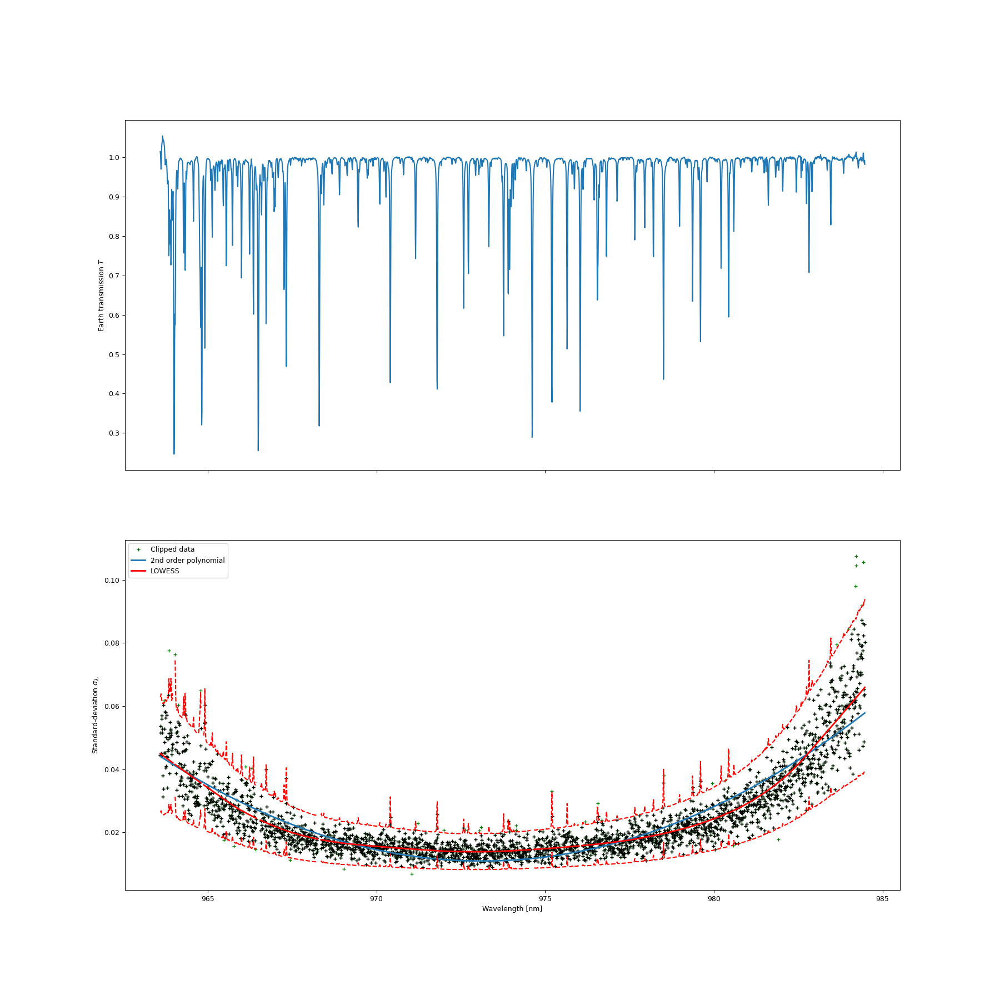

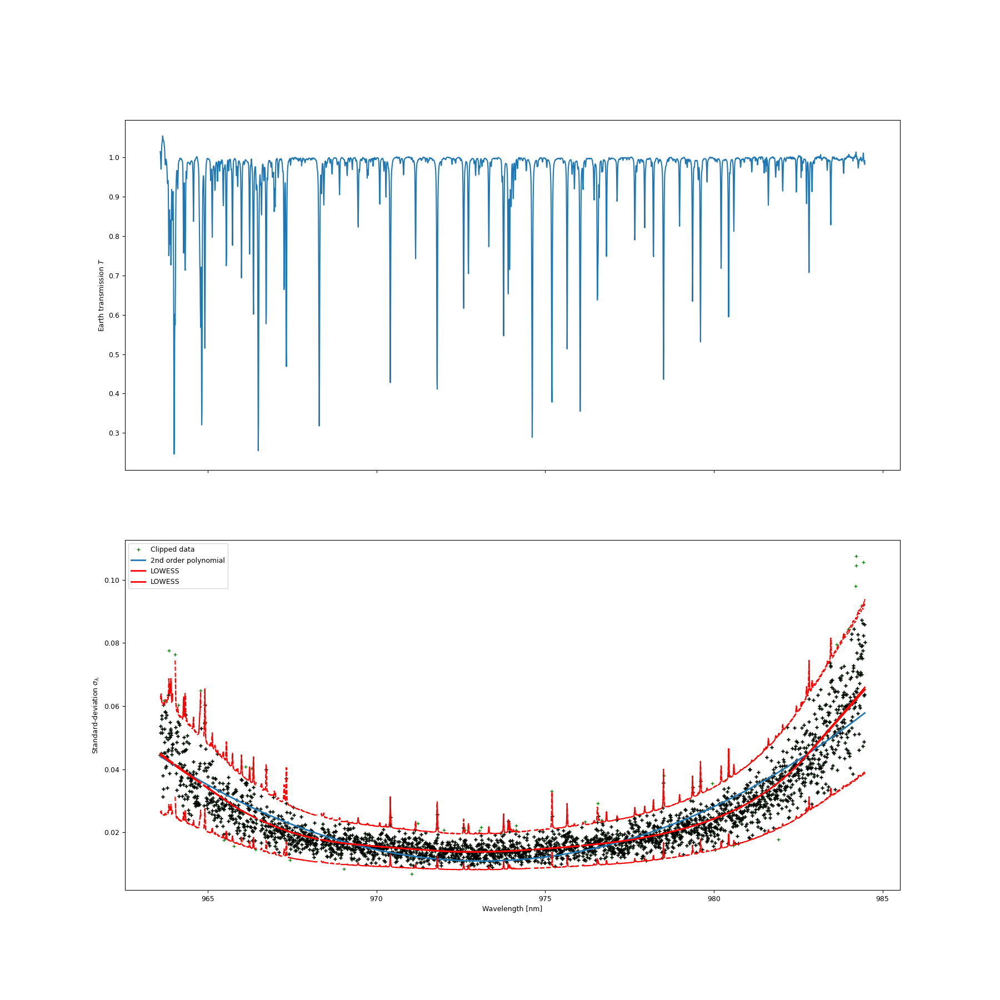

49/49

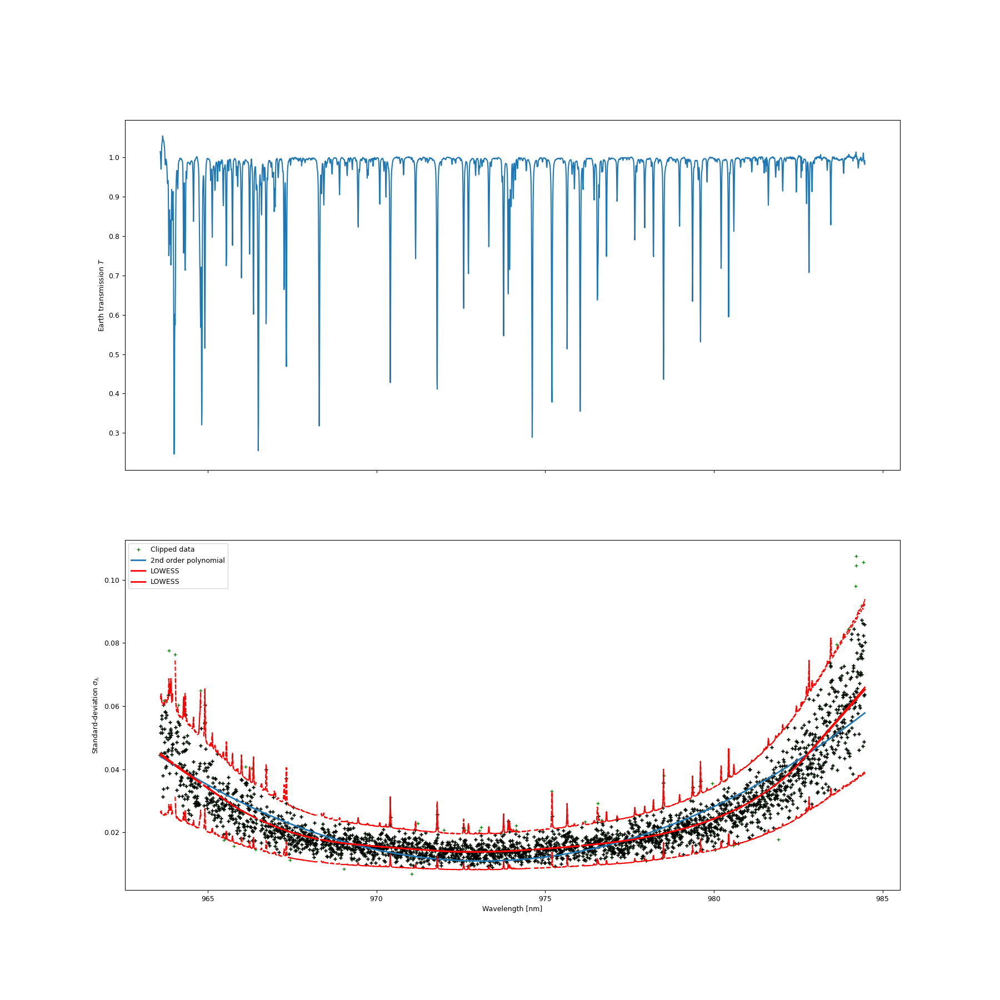


Sigma clipping on temporal standard deviation done !

This step has been saved with ID : 'sigma_clipping_std'
------------------------------


In [22]:
data_set.sigma_clipping_on_std(n_sigma=3, frac=0.2, max_iterations=5,orders_to_plot=[0],transmission_correction=True)


**Remove one**

For computing CCF or MCMC we often need the data to be centered at 0. All above reduction steps keep the data centered at 1, so we have a simple function to bring data to a 0 mean:

In [23]:
data_set.remove_one()



Substract 1. done !

This step has been saved with ID : 'remove_one'
------------------------------


### Plots from reduction

Throughout the reduction, the DataSet class has stored all results from the individual reduction steps in its memory. This allows us to quickly monitor the effect of each reduction steps and ensure everything went fine:

Plotting find_off_transit Vs load_data...
Plotting load_data Vs div_by_blaze...
Plotting div_by_blaze Vs telluric_transmission_clipping...
Plotting telluric_transmission_clipping Vs norm_with_median...
Plotting norm_with_median Vs sigma_clipping_obs...
Plotting sigma_clipping_obs Vs div_by_moving_average...
Plotting div_by_moving_average Vs airmass_correction...
Plotting airmass_correction Vs div_by_weighted_average...
Plotting div_by_weighted_average Vs SysREM_Kneedle...
Plotting SysREM_Kneedle Vs sigma_clipping_std...
Plotting sigma_clipping_std Vs remove_one...


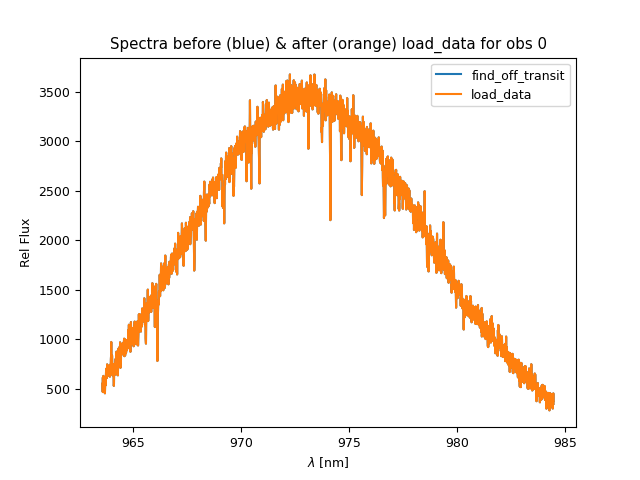

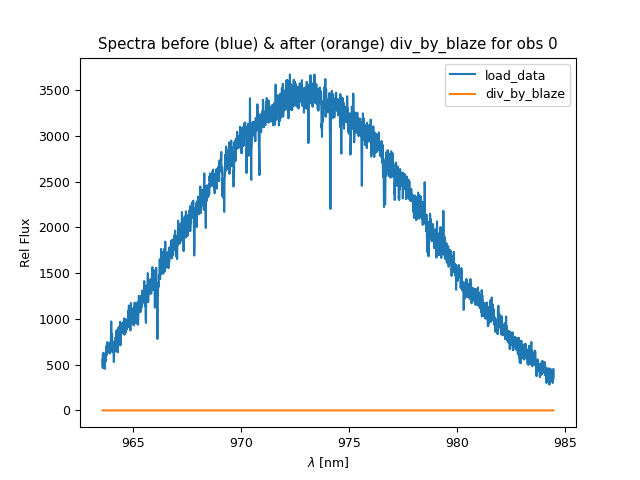

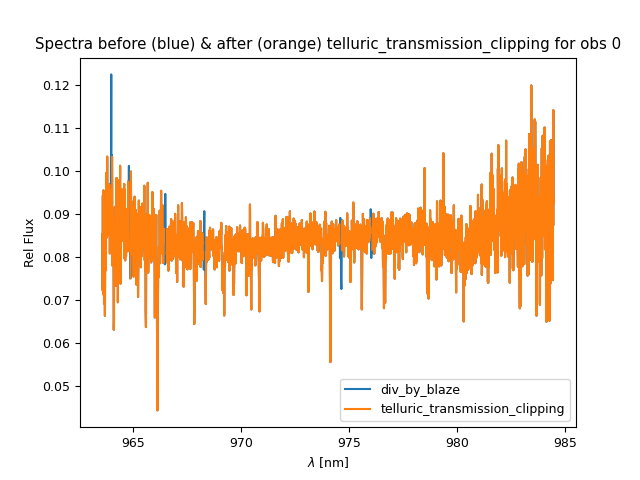

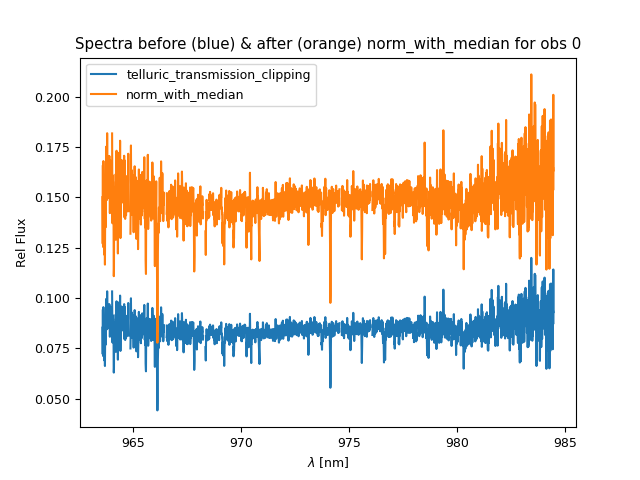

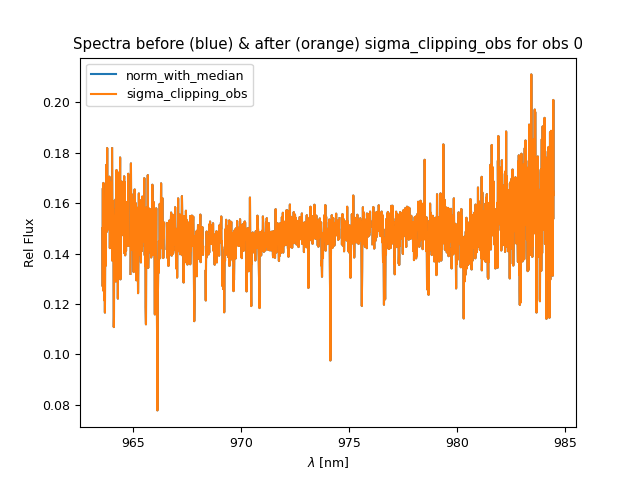

...

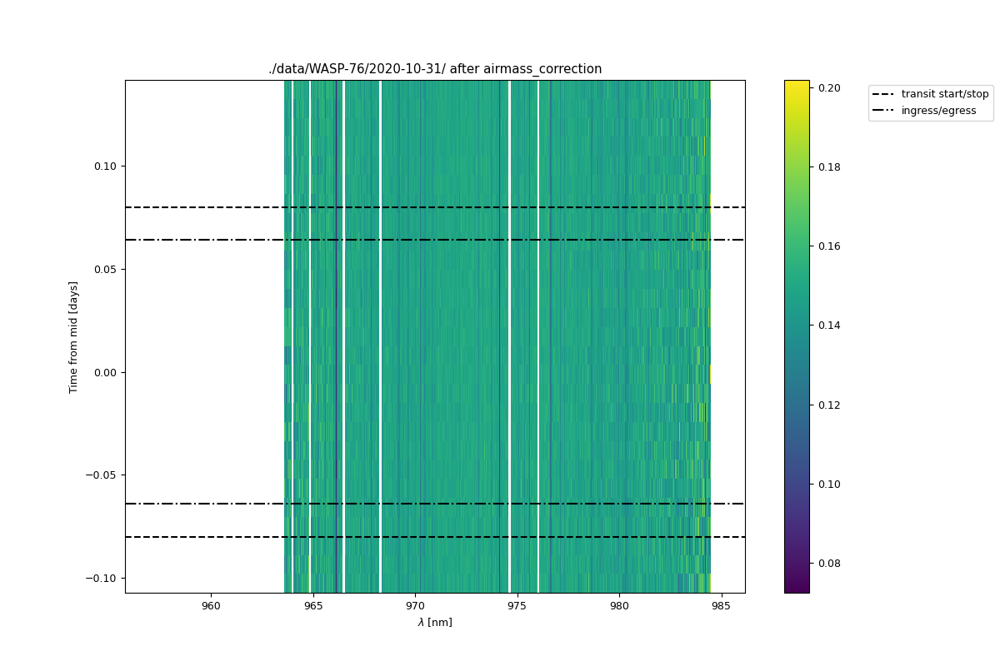

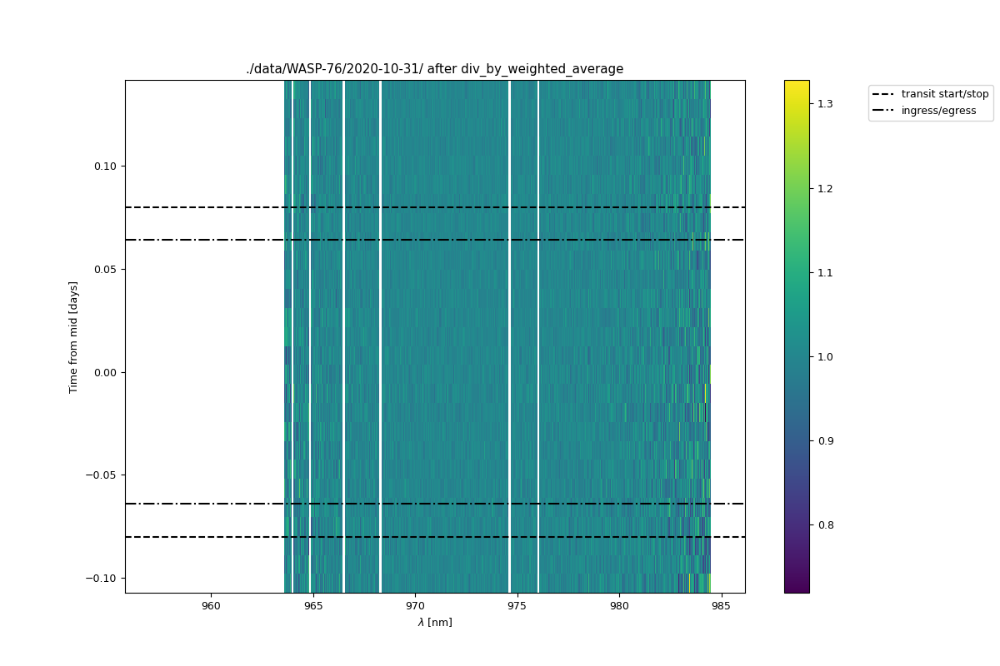

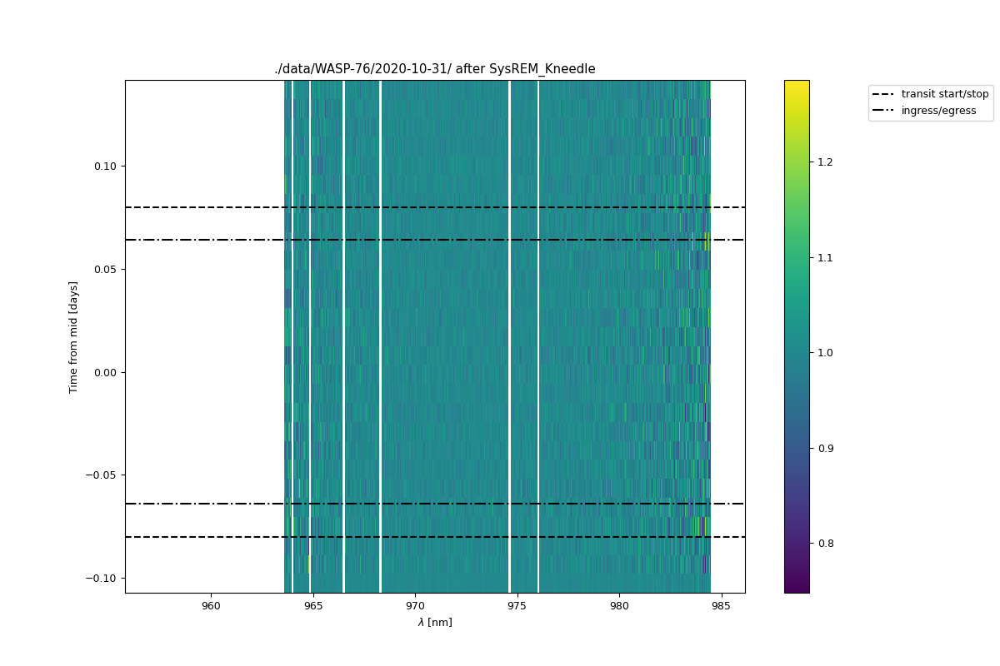

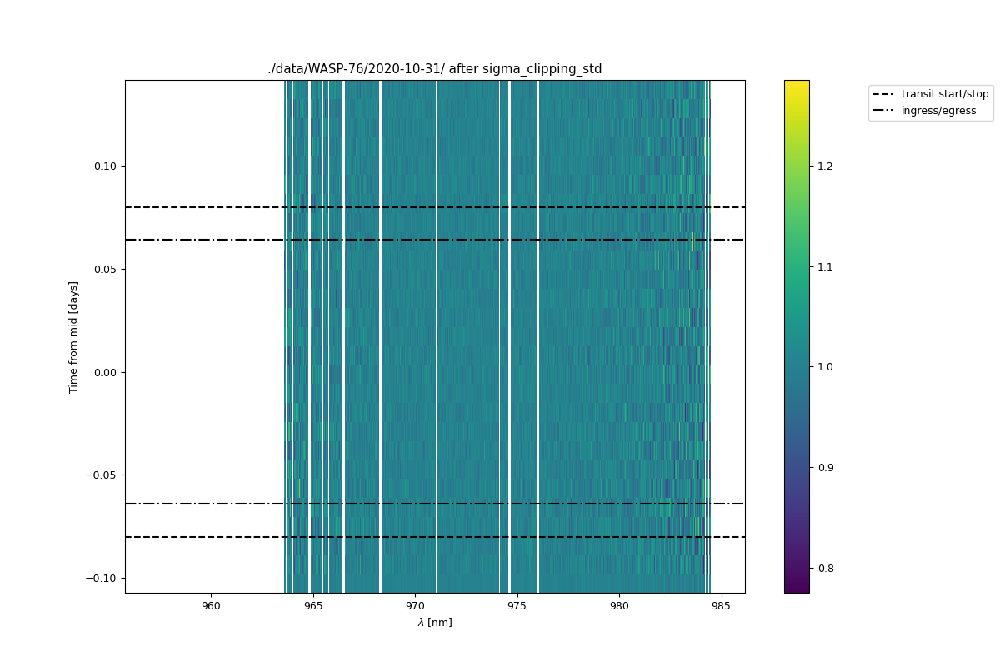

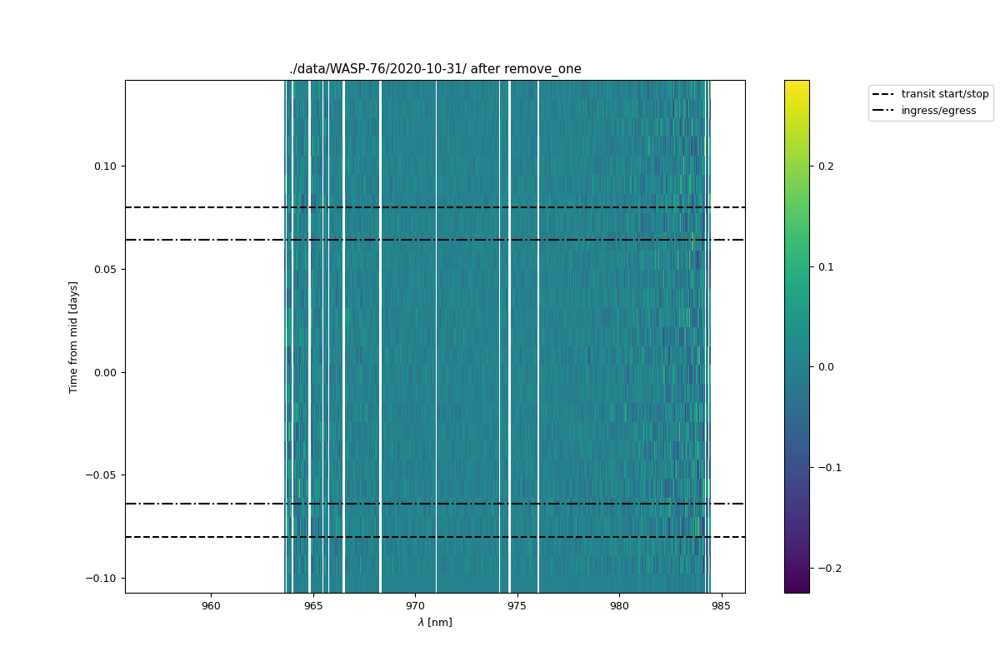

In [24]:
# plot the effect of each reduction step for a given observation and order
obs, order = 0, 0
data_set.plot_all_before_after(obs,order)

# plot the effect of each reduction step in a 2D time series for a given order
data_set.plot_2d_step(order, contact_point=True)


One can also access the whole reduction history of a DataSet along with the corresponding parameters and data with the following commands:

In [25]:
print(f'Reduction steps: {data_set.history.keys()}')

print('\nParameters:')
pprint(data_set.history["SysREM_Kneedle"]["parameters"])

print('\nData shape')
print(data_set.history["SysREM_Kneedle"]["data"].shape)


Reduction steps: dict_keys(['find_off_transit', 'load_data', 'div_by_blaze', 'telluric_transmission_clipping', 'norm_with_median', 'sigma_clipping_obs', 'div_by_moving_average', 'airmass_correction', 'div_by_weighted_average', 'SysREM_Kneedle', 'sigma_clipping_std', 'remove_one'])

Parameters:
{'Nb_threads': 6,
 'print_info': True,
 'save': True,
 'show_var': True,
 'sigma_weights': True,
 'use_log': True}

Data shape
(27, 49, 4088)


### Saving the reduced data

One of the advantage of working with the DataSet class is the possibility to save it as a whole and reload it later. This is done with the built-in saving method:

In [26]:
data_set.save(path='reduced_data/',name='wasp76_example')


DataSet succesfully saved in reduced_data/wasp76_example.pkl !


This will also save an "_history.txt" file containing a summary of the reduction and all parameters that we used for the reduction: [wasp76_example_history.txt](reduced_data/wasp76_example_history.txt)

We can then load a previously saved DataSet with the *pickle* module:

Data Set succesfully loaded !

Reduction history: dict_keys(['find_off_transit', 'load_data', 'div_by_blaze', 'telluric_transmission_clipping', 'norm_with_median', 'sigma_clipping_obs', 'div_by_moving_average', 'airmass_correction', 'div_by_weighted_average', 'SysREM_Kneedle', 'sigma_clipping_std', 'remove_one'])


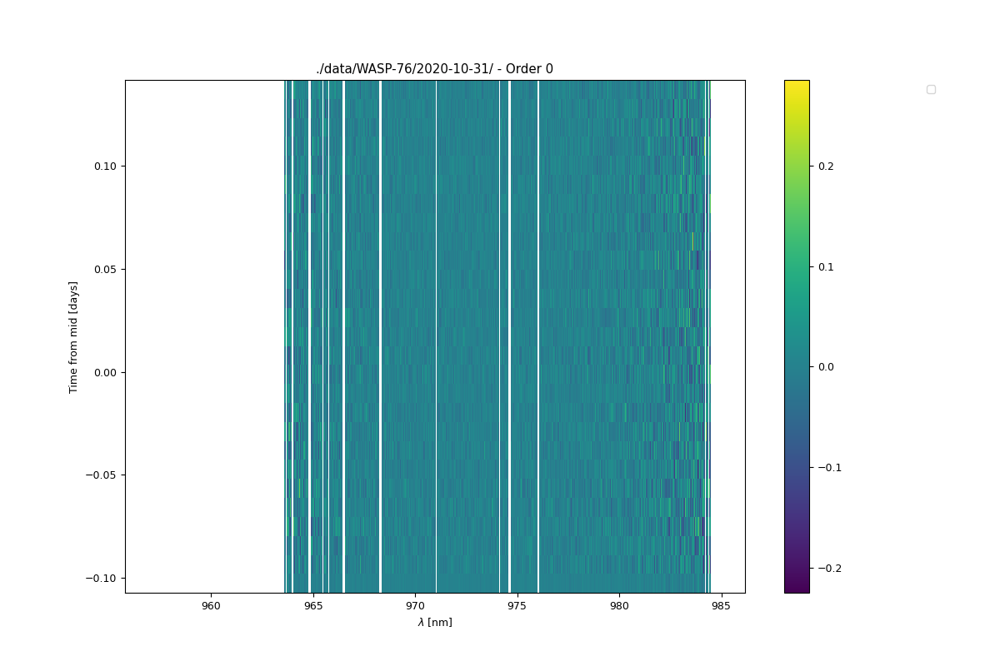

In [27]:
import pickle

with open('./reduced_data/wasp76_example.pkl', 'rb') as f:
    data_set_2 = pickle.load(f)
    print('Data Set succesfully loaded !')

# check that we properly loaded our data set:
print('\nReduction history:', data_set_2.history.keys())

data_set_2.plot_2d_order(0)


### Quick reduction setup example

One of the main advantages of the DataSet class is to quickly setup and compare different reduction paths, for example with functions:

In [ ]:
def testing_reduction_1(data_set):
    '''
    My first reduction test
    '''
    data_set.div_by_blaze()                                                                                              # div by blaze
    data_set.telluric_transmission_clipping(remove_entire_spec_line = True)                                              # telluric transmission clipping
    data_set.norm_with_median()                                                                                          # normalisation with median
    data_set.sigma_clipping_on_obs(model_deg=2,iterations=5,n_sigma=4,plot_sigma=False)                                  # sigma clipping along obs
    data_set.div_by_moving_average(119)                                                                                  # div by moving average
    data_set.div_by_weighted_average()                                                                                   # div by master
    data_set.sigma_clipping_on_std(n_sigma=3, frac=0.2, max_iterations=5,orders_to_plot=[],transmission_correction=True) # sigma clipping spectral
    data_set.SysREM_Kneedle(use_log=True,show_var=True,Nb_threads=6,sigma_weights=False)                                 # SysREM
    data_set.sigma_clipping_on_obs(model_deg=2,iterations=5,n_sigma=4,plot_sigma=False)                                  # sigma clipping along obs
    data_set.remove_one()                                                                                                # Remove 1. to center around 0.
    data_set.mask_null_RV_obs(threshold=2.28e3)                                                                          # mask any obs with planetary RV < threshold in earth RF. Do it at the end of reduction, to keep these obs when fitting telluric/stellar signals
    print('Reduction done !')

def testing_reduction_2(data_set):
    '''
    My second reduction test
    '''
    data_set.div_by_blaze()                                                                                              # div by blaze
    data_set.telluric_transmission_clipping(remove_entire_spec_line = True)                                              # telluric transmission clipping
    data_set.norm_with_median()                                                                                          # normalisation with median
    data_set.sigma_clipping_on_obs(model_deg=2,iterations=5,n_sigma=4,plot_sigma=False)                                  # sigma clipping along obs
    data_set.div_by_moving_average(119)                                                                                  # div by moving average
    data_set.div_by_weighted_average()                                                                                   # div by master
    data_set.sigma_clipping_on_std(n_sigma=3, frac=0.2, max_iterations=5,orders_to_plot=[],transmission_correction=True) # sigma clipping spectral
    data_set.sigma_clipping_on_obs(model_deg=2,iterations=5,n_sigma=4,plot_sigma=False)                                  # sigma clipping along obs
    data_set.remove_one()                                                                                                # Remove 1. to center around 0.
    print('Reduction done !')


### Computing a petitRADTRANS model and a CCF map

Once the data have been reduced, we can use our DataSet object to initialize a new class called *AtmoModel* that will handle the computation of a high-resolution spectrum with petitRADTRANS. 

**Note that for petitRADTRANS to work you will probably need to download the line lists that you need and configure petitRADTRANS with the folder where your line lists are stored.**

We define our model like this:

In [28]:
from HR_SpARTA.AtmoModel import AtmoModel

Model = AtmoModel(data_set, 
                  species = ['H2O','CO'])


09:56:09.769088 : AtmoModel.py has been loaded
Loading Radtrans opacities...
 Loading line opacities of species 'H2O' from file '/home/amasson/data/petitRADTRANS/Lines/input_data/opacities/lines/line_by_line/H2O/1H2-16O/1H2-16O__HITRAN.R1e6_0.3-28mu.xsec.petitRADTRANS.h5'... Done.
 Loading line opacities of species 'CO' from file '/home/amasson/data/petitRADTRANS/Lines/input_data/opacities/lines/line_by_line/CO/12C-16O/12C-16O__HITEMP.R1e6_0.3-28mu.xsec.petitRADTRANS.h5'... Done.
 Successfully loaded all line opacities
 Loading CIA opacities for H2-H2 from file '/home/amasson/data/petitRADTRANS/Lines/input_data/opacities/continuum/collision_induced_absorptions/H2--H2/H2--H2-NatAbund/H2--H2-NatAbund__BoRi.R831_0.6-250mu.ciatable.petitRADTRANS.h5'... Done.
 Loading CIA opacities for H2-He from file '/home/amasson/data/petitRADTRANS/Lines/input_data/opacities/continuum/collision_induced_absorptions/H2--He/H2--He-NatAbund/H2--He-NatAbund__BoRi.DeltaWavenumber2_0.5-500mu.ciatable.petitRADTR

Which load the line lists required to compute our models and also extract all required information (planet and stellar parameters, spectral range...) from the DataSet class. 

We can then compute a petitRADTRANS model like this:

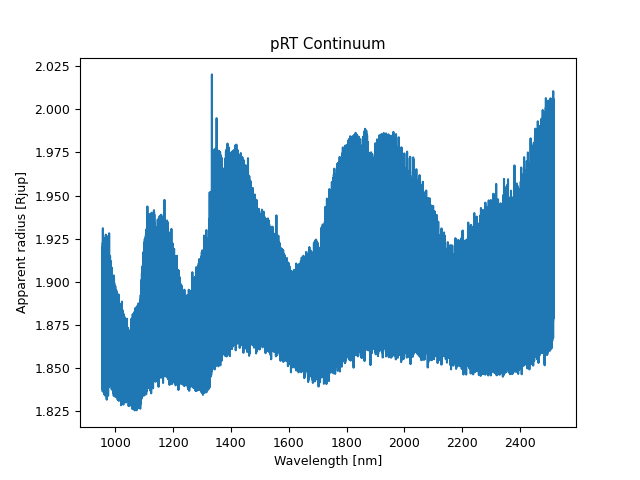

In [29]:
atmo_parameters = {
'Tiso' : 1500, # K
'log_MMR' : {
    'H2O': -2, # log_10 of Mass Mixing Ratio
}
}

wave, transit_radius = Model.compute_pRT(atmo_parameters,plot=True)


The AtmoModel also provides tools to compute a synthetic time series corresponding to our transit:

Mean broadening induced by planet delta RV during integration time: 6.15e+03 m/s
TODO: implement simple broadening due to planet rotation
Performing simple sampling here with no flux conservation !


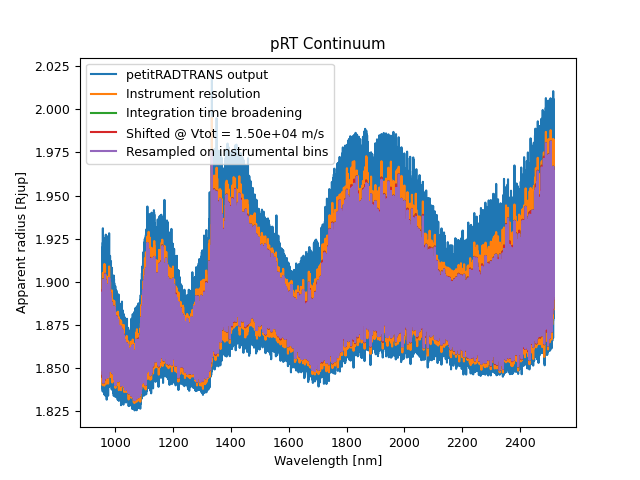

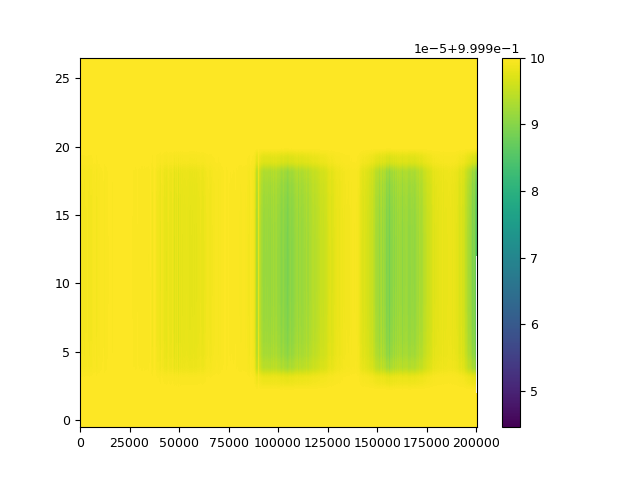

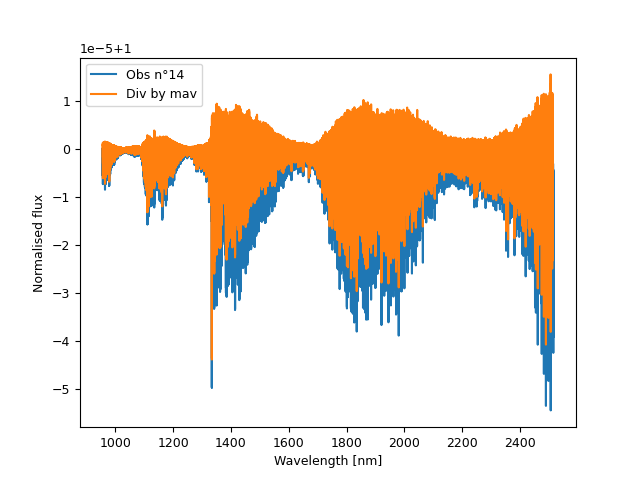

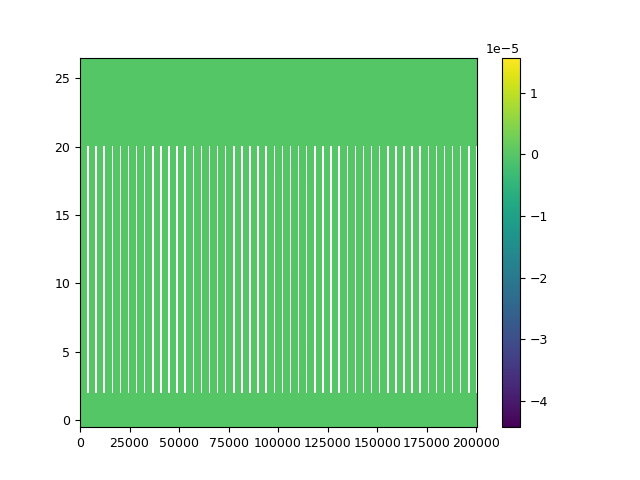

In [30]:
synthetic = Model.compute_synthetic(Kp=150e3,
                                    V0=0,
                                    atmo_parameters=atmo_parameters,
                                    mav_area=119,
                                    plot=True,
                                    lower_to_instrument_resolution='SPIRou')


As well as a method to compute a 2D CCF map with parallel computing:

Convolving petitRADTRANS model to instrument & integration time broadening...
Mean broadening induced by planet delta RV during integration time: 6.15e+03 m/s
TODO: implement simple broadening due to planet rotation
500/500
CCF Time-Series done in 42.8473002910614s
100 %(500, 300)


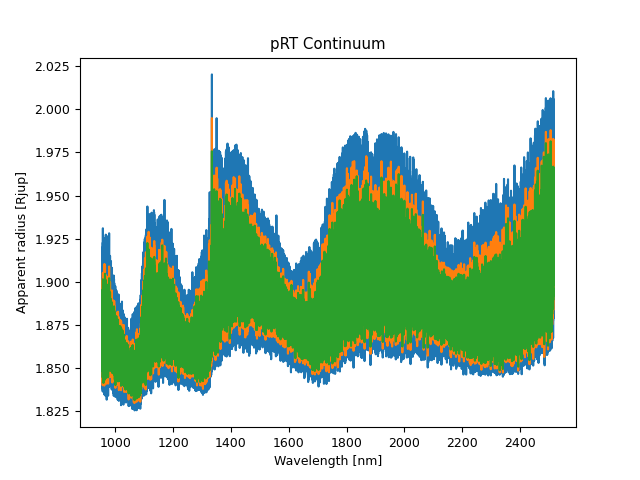

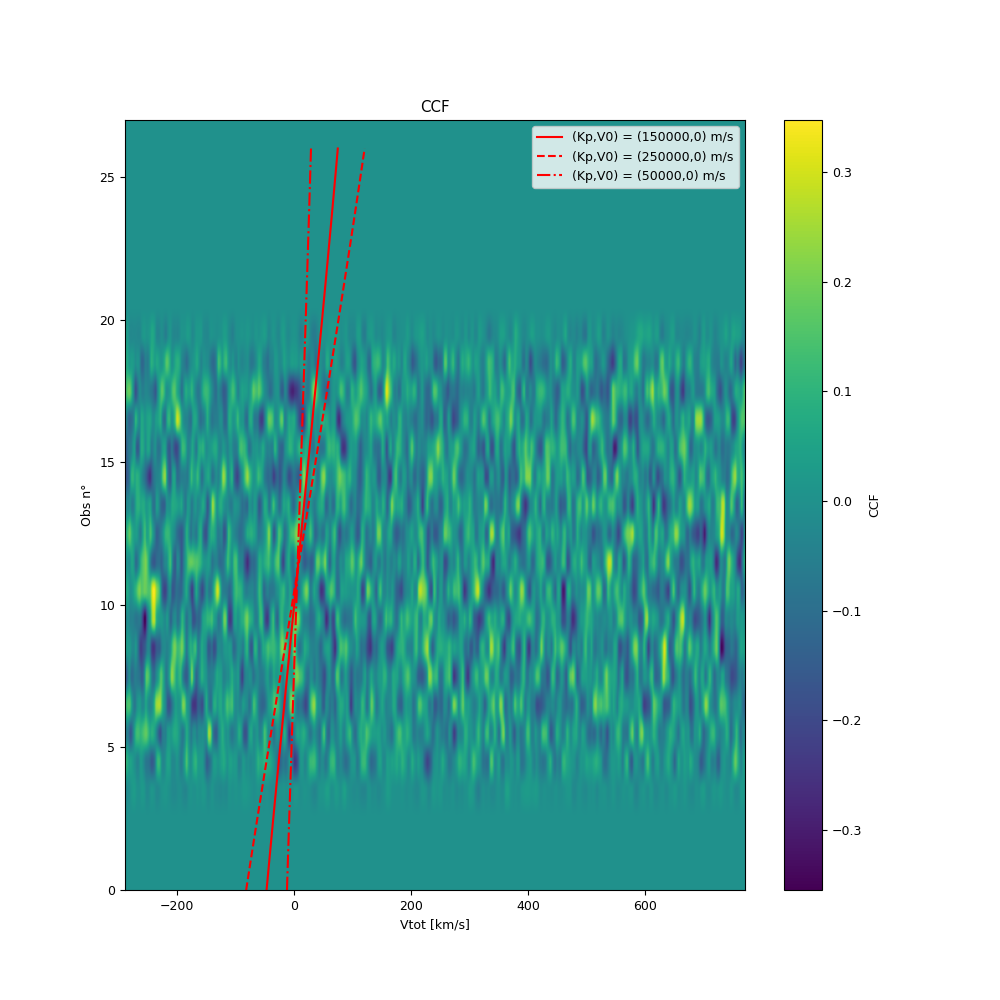

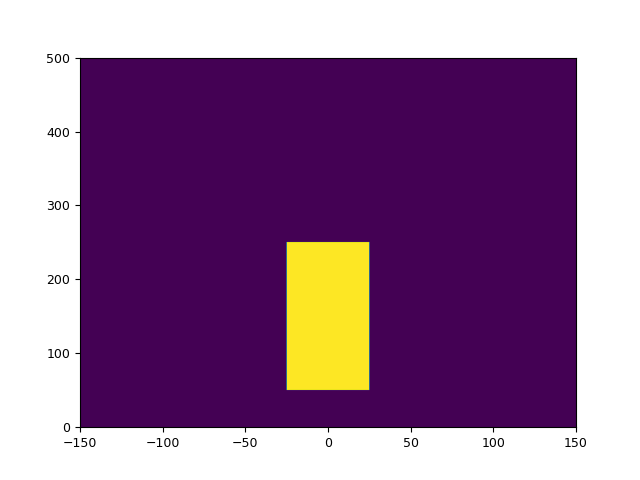

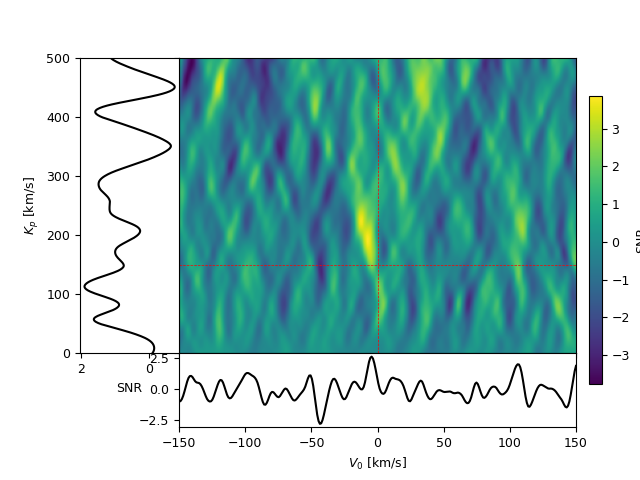

In [31]:
result,CCF = Model.CCF_2D(  wave, transit_radius,
                            lower_to_instrument_resolution='SPIRou',
                            Kpmin=0,Kpmax=500e3,V0min=-150e3,V0max=+150e3,Kp_ref=150e3,V0_ref=0,
                            NKp=500,NV0=300,NVtot=500,mav_area=119,
                            divide_by_sigma = True,plot=True,apply_svd=False,build_interp_grid=False,
                            Nb_threads=8,ccf_mask=[-25e3,+25e3,150e3-100e3,150e3+100e3]
                            )


**And that's all Folks!**